# Install necessary libraries

In [7]:
# pip install torchvision

# Import necessary libraries

In [8]:
import os
import zipfile
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
# from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

# Boilerplate code

In [9]:
location = os.path.normpath(os.getcwd() + os.sep + os.pardir)

# Description

In [30]:
path = os.path.join(location + "\\Desc_and_PS\\", 'Description.txt')
with open(path) as f:
    lines = f.readlines()
lines[0]

'Description : A collection of water bodies images captured by the Sentinel-2 Satellite. Each image comes with a black and white mask where white represents water and black represents something else but water. The masks were generated by calculating the NWDI (Normalized Water Difference Index) which is frequently used to detect and measure vegetation in satellite images, but a greater threshold was used to detect water bodies.'

# Problem Statement

In [31]:
path = os.path.join(location + "\\Desc_and_PS\\", 'Problem_Statement.txt') 
with open(path) as f:
    lines = f.readlines()
lines[0]

'Problem Statement: Segment the water bodies from satellite images.'

# Load the data

In [88]:
path = os.path.join(location + "\\Dataset\\", 'Segmentation_Dataset.zip')
path

'C:\\Users\\Kshitij\\Documents\\solns_new\\TMLC_April_Cohort_Projects_12\\Project_12_Water_body_segmentation_in_Satellite_Images(Image_Segmentation)\\Dataset\\Segmentation_Dataset.zip'

In [75]:
# Directory
directory = "ExtractZip"
  
# Parent Directory path
parent_dir = location + "\\dataset\\"
  
# Path
pathz = os.path.join(parent_dir, directory)

In [76]:
os.mkdir(pathz)

In [87]:
# Specify the path of the directory you want to view
target_directory = location + "\\Dataset"

# List all the files in the specified directory
files_in_directory = os.listdir(target_directory)

# Print the list of files
for filename in files_in_directory:
    print(filename)

ExtractZip
Segmentation_Dataset.zip
Source_of_data.txt


In [89]:
with zipfile.ZipFile(path, 'r') as zip_ref:
    zip_ref.extractall(pathz)

In [94]:
dirname, _, filenames = next(os.walk(target_directory+"\\ExtractZip\\Water Bodies Dataset"))
_

['Images', 'Masks']

In [107]:
images_dir =  location + "\\Dataset\\ExtractZip\\Water Bodies Dataset\\Images"
masks_dir = location + "\\Dataset\\ExtractZip\\Water Bodies Dataset\\Masks"

In [111]:
image_files = os.listdir(images_dir)
image_files_count = len(image_files)

In [112]:
mask_files = os.listdir(masks_dir)
mask_files_count = len(mask_files)

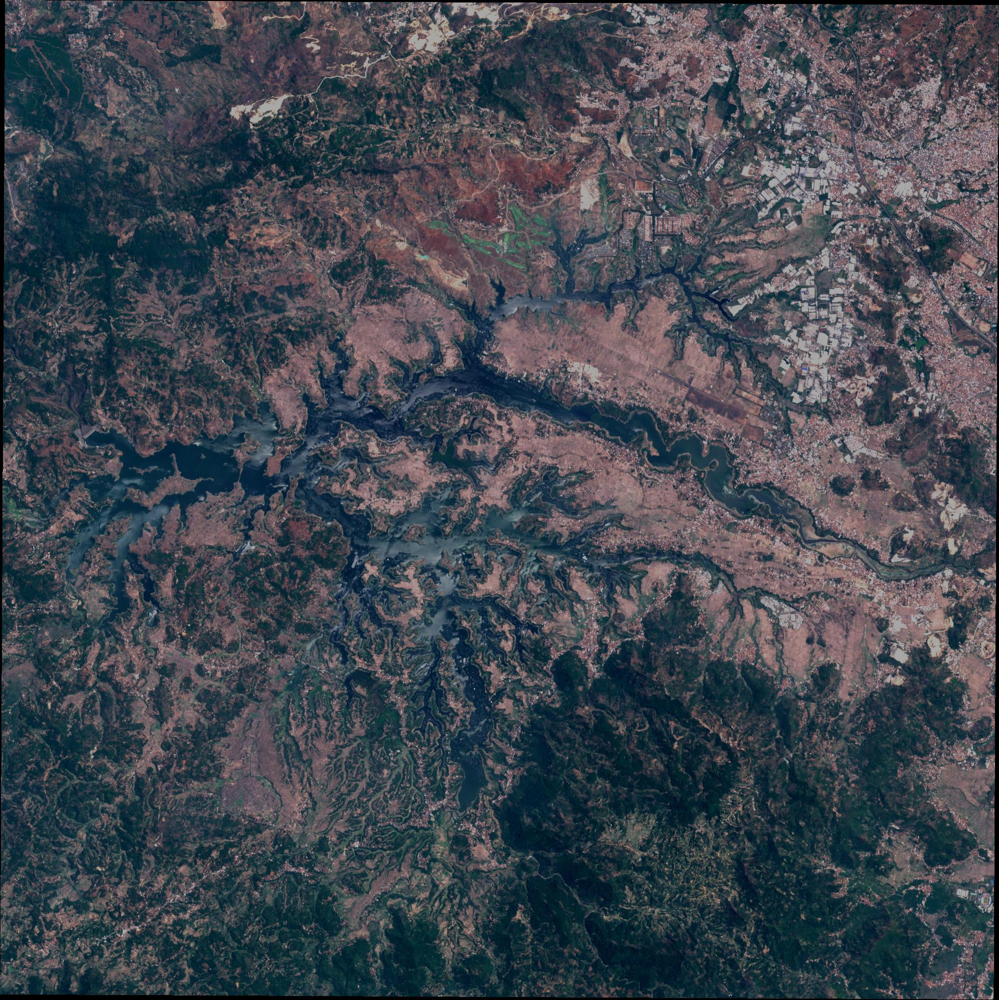

In [120]:
Image.open(images_dir + "\\" +image_files[0])

# Exploratory Data Analysis

In [126]:
examples = []
image_files[:3]

['water_body_1.jpg', 'water_body_10.jpg', 'water_body_100.jpg']

In [128]:
for i in image_files[:3]:
    img = Image.open(images_dir + "\\" +i)
    mask = Image.open(masks_dir + "\\" +i)
    examples.append((img,mask))

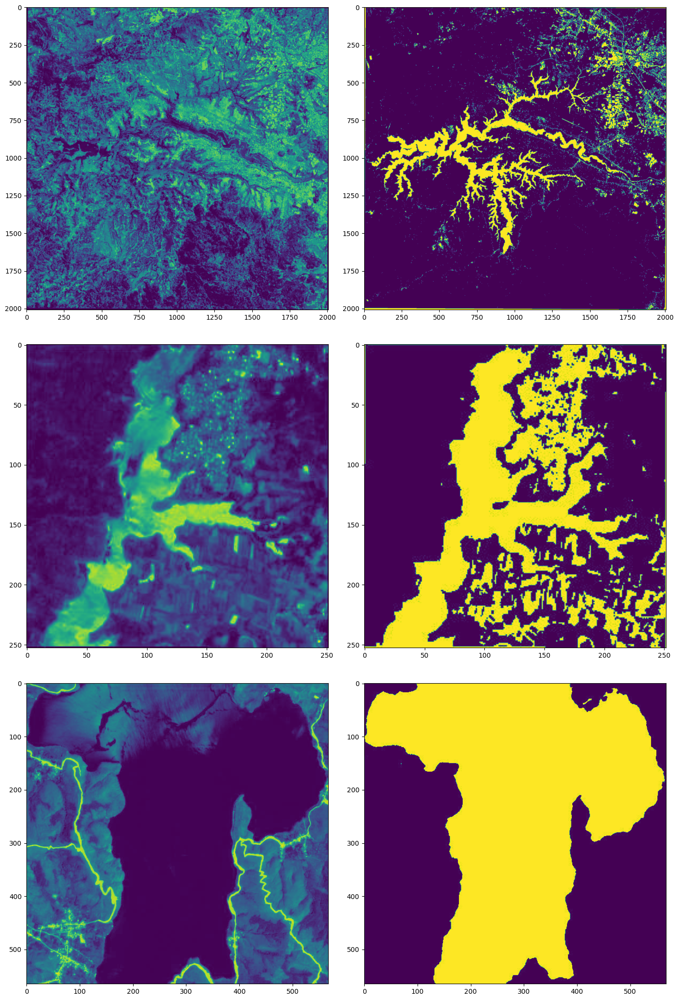

In [134]:
n_examples = 3
fig, axs = plt.subplots(n_examples, 2, figsize=(14, n_examples*7), constrained_layout=True)
for ax, (image, mask) in zip(axs, examples):
    ax[0].imshow(image.getchannel(0))
    ax[1].imshow(mask.getchannel(0))

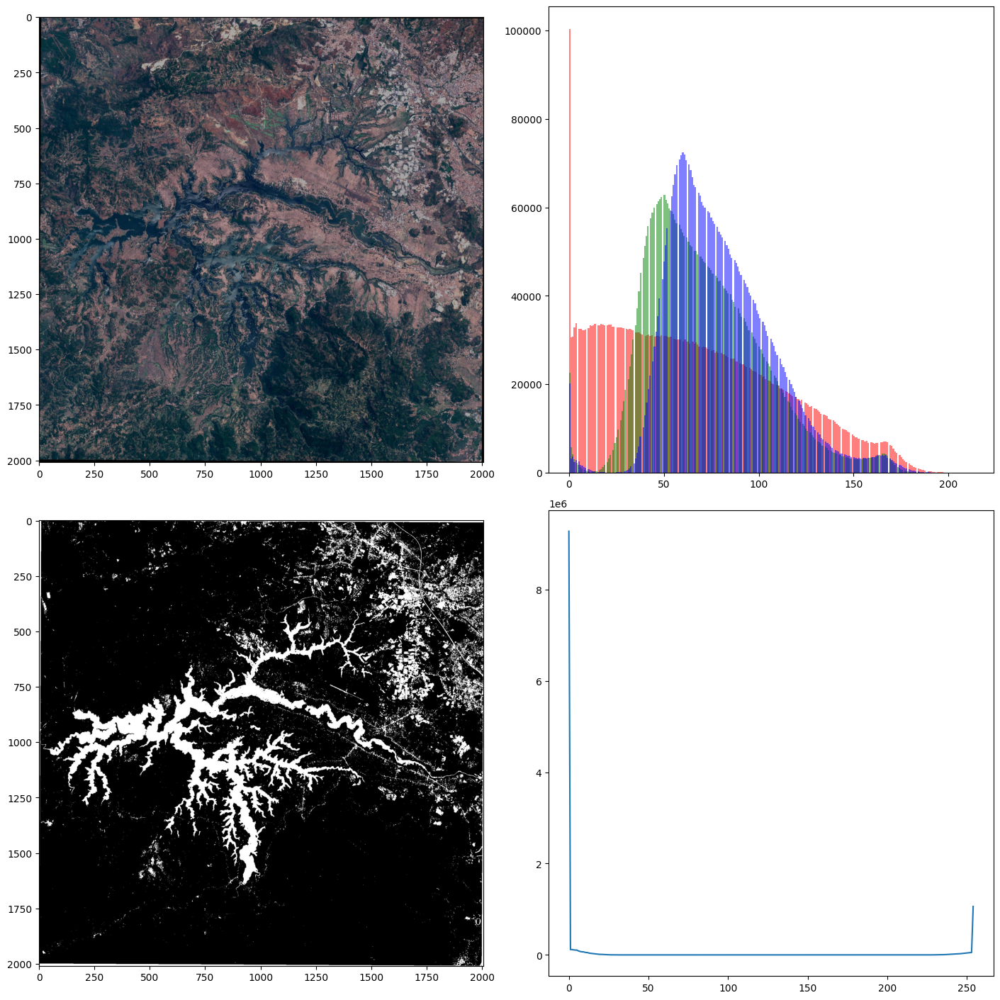

In [137]:
fig, axs = plt.subplots(2, 2, figsize=(14, 14), constrained_layout=True)
example_image, example_mask = examples[0]
example_image = np.array(example_image)
example_mask = np.squeeze(example_mask)
axs[0][0].imshow(example_image)
axs[0][1].hist(example_image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
axs[0][1].hist(example_image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
axs[0][1].hist(example_image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)

axs[1][0].imshow(example_mask)
histogram, bin_edges = np.histogram(example_mask, bins=256)
axs[1][1].plot(bin_edges[0:-1], histogram);

# Preprocessing the data

In [138]:
def resize_images(images, masks, max_image_size=1500):
    shape = images.shape
    scale = (max(shape[-3], shape[-2]) // max_image_size) + 1
    target_height, target_width = shape[-3] // scale, shape[-2] // scale
    images = images.float()
    masks = masks.float()
    if scale != 1:
        images = F.interpolate(images, size=(target_height, target_width), mode='nearest')
        masks = F.interpolate(masks, size=(target_height, target_width), mode='nearest')
    return images, masks

def scale_values(images, masks, mask_split_threshold=128):
    images = images / 255.0
    masks = (masks > mask_split_threshold).float()
    return images, masks

def pad_images(images, masks, pad_mul=16, offset=0):
    shape = images.shape
    height, width = shape[-3], shape[-2]
    target_height = height + (-height) % pad_mul
    target_width = width + (-width) % pad_mul
    images = F.pad(images, (offset, target_width - width + offset, offset, target_height - height + offset))
    masks = F.pad(masks.to(torch.uint8), (offset, target_width - width + offset, offset, target_height - height + offset))
    return images, masks

# Training the Model

# Testing the Model